<a href="https://colab.research.google.com/github/kpoage12/Projects/blob/main/Final_Project_Mask_Detection_System.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Mask Detection System
#
#
# Authors:
# Weizhi Du
# Kyle Poage
# David Yang
#
# Diagram: https://drive.google.com/file/d/1mZEAO9-qFIZo0WyboOaSsa2xQ0-PDN05/view?usp=sharing
#
# Reference: 
# https://github.com/balajisrinivas/Face-Mask-Detection
# https://github.com/humandecoded/People-Detector
#

In [ ]:
# Import libraries

import os
import zipfile
import random
import tensorflow as tf
print(tf.test.gpu_device_name())

from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from shutil import copyfile

In [ ]:
# Get the dataset from Weizhi's Google drive
# Data source: https://github.com/balajisrinivas/Face-Mask-Detection

import zipfile
from google.colab import drive

drive.mount('/content/drive/')

zip_ref = zipfile.ZipFile("/content/drive/My Drive/Colab Notebooks/MD_sample/dataset.zip", 'r')
zip_ref.extractall('')
zip_ref.close()



Mounted at /content/drive/


In [ ]:
# Create directories and move files

!mkdir -p /content/sample/
!mkdir -p /content/sample/yes
!mkdir -p /content/sample/no

!mv /content/dataset/with_mask/* /content/sample/yes
!mv /content/dataset/without_mask/* /content/sample/no

print(len(os.listdir('/content/sample/yes')))
print(len(os.listdir('/content/sample/no')))

1915
1918


In [ ]:
# Check corrupted images

import os
import cv2
bad_list=[]
dir=r'/content/sample/'
class_list=os.listdir(dir) # create a list of the sub directories in the directory ie train or test
print (class_list)
for klass in class_list: # iterate through the two classes
            class_path=os.path.join(dir, klass) # path to class directory
            #print(class_path)
            file_list=os.listdir(class_path) # create list of files in class directory
            for f in file_list: # iterate through the files
                fpath=os.path.join (class_path,f)
                index=f.rfind('.') # find index of period infilename
                ext=f[index+1:] # get the files extension
                if ext not in ['jpeg', 'jpg', 'png', 'bmp', 'gif']:
                    print(f'file {fpath}  has an invalid extension {ext}')
                    bad_list.append(fpath)                    
                else:
                    try:
                        img=cv2.imread(fpath)
                        size=img.shape
                    except:
                        print(f'file {fpath} is not a valid image file ')
                        bad_list.append(fpath)
                       
print(bad_list)
for image in bad_list:
  os.remove(image)


['yes', 'no']
file /content/sample/yes/0_0_2.JPEG  has an invalid extension JPEG
file /content/sample/yes/1_0_0.JPEG  has an invalid extension JPEG
file /content/sample/yes/0_0_1 copy.JPEG  has an invalid extension JPEG
file /content/sample/yes/with_mask431.JPG  has an invalid extension JPG
file /content/sample/yes/with_mask360.JPG  has an invalid extension JPG
file /content/sample/yes/with_mask097.JPG  has an invalid extension JPG
['/content/sample/yes/0_0_2.JPEG', '/content/sample/yes/1_0_0.JPEG', '/content/sample/yes/0_0_1 copy.JPEG', '/content/sample/yes/with_mask431.JPG', '/content/sample/yes/with_mask360.JPG', '/content/sample/yes/with_mask097.JPG']


In [ ]:
# Create training and validation set

img_height=224
img_width=224
batch_size=250
train_data_dir = "/content/sample/"
train_datagen = ImageDataGenerator(rescale=1./255.,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2) # set validation split

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='training') # set as training data

validation_generator = train_datagen.flow_from_directory(
    train_data_dir, # same directory as training data
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary',
    subset='validation') # set as validation data

Found 3063 images belonging to 2 classes.
Found 764 images belonging to 2 classes.


1.0


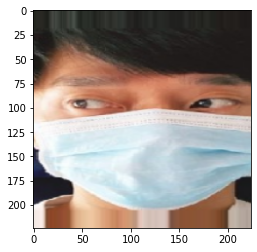

0.0


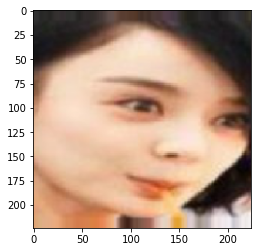

1.0


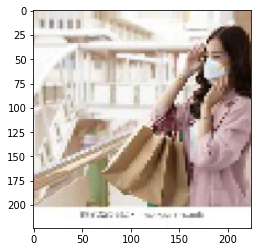

1.0


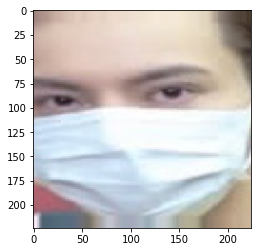

0.0


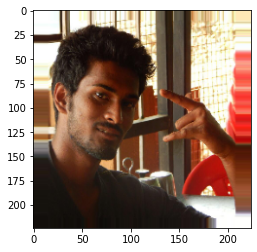

In [ ]:
%matplotlib inline

import matplotlib.image  as mpimg
import matplotlib.pyplot as plt
x_batch, y_batch = next(train_generator)
for i in range (0,5):
    image = x_batch[i]
    print(y_batch[i])
    plt.imshow(image)
    plt.show()

# With mask: 1.0
# Without mask: 0.0

In [ ]:
# VGG16

from tensorflow.keras.applications.vgg16 import VGG16
# load model
model = VGG16() 
# summarize the model
model.summary()

553476096/553467096 [==============================] - 5s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
# Define CNN model

def define_model():
	# load model
	model = VGG16(include_top=False, input_shape=(224, 224, 3))
	# mark loaded layers as not trainable
	for layer in model.layers:
		layer.trainable = False
	# add new classifier layers
	flat1 = Flatten()(model.layers[-1].output)
	class1 = Dense(128, activation='relu', kernel_initializer='he_uniform')(flat1)
 
  # output
	output = Dense(1, activation='sigmoid')(class1)
 
	# define new model
	model = Model(inputs=model.inputs, outputs=output)
	# compile model
	opt = SGD(lr=0.001, momentum=0.9)
 
  # compile model
	model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
	model.summary()
	return model

In [ ]:
# plot diagnostic learning curves
def summarize_diagnostics(history):
  # plot loss
  pyplot.subplot(211)
  pyplot.title('Cross Entropy Loss')
  pyplot.plot(history.history['loss'], color='blue', label='train')
  pyplot.plot(history.history['val_loss'], color='orange', label='test')
  # plot accuracy
  pyplot.subplot(212)
  pyplot.title('Classification Accuracy')
  pyplot.plot(history.history['accuracy'], color='blue', label='train')
  pyplot.plot(history.history['val_accuracy'], color='orange', label='test')
  # save plot to file
  filename = sys.argv[0].split('/')[-1]
  pyplot.savefig(filename + '_plot.png')
  pyplot.show()
  pyplot.close()

In [ ]:
# MODEL TRAINING

import sys
from matplotlib import pyplot
from tensorflow.keras.utils import to_categorical 
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator

model = define_model()
history = model.fit(train_generator, steps_per_epoch=len(train_generator),
		validation_data=validation_generator, validation_steps=len(validation_generator), epochs=5, verbose=1)

58900480/58889256 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


Epoch 1/5


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


13/13 [==============================] - 1917s 149s/step - loss: 0.6211 - accuracy: 0.6441 - val_loss: 0.5236 - val_accuracy: 0.5785
Epoch 2/5
13/13 [==============================] - 1919s 149s/step - loss: 0.3667 - accuracy: 0.8750 - val_loss: 0.2674 - val_accuracy: 0.9228
Epoch 3/5
13/13 [==============================] - 1918s 149s/step - loss: 0.2311 - accuracy: 0.9380 - val_loss: 0.1830 - val_accuracy: 0.9686
Epoch 4/5
13/13 [==============================] - 1919s 149s/step - loss: 0.1887 - accuracy: 0.9409 - val_loss: 0.1700 - val_accuracy: 0.9751
Epoch 5/5
13/13 [==============================] - 1930s 150s/step - loss: 0.1731 - accuracy: 0.9478 - val_loss: 0.1377 - val_accuracy: 0.9817


In [ ]:
_, acc = model.evaluate(validation_generator, steps=len(validation_generator), verbose=0)
print('> %.3f' % (acc * 100.0))

> 98.429


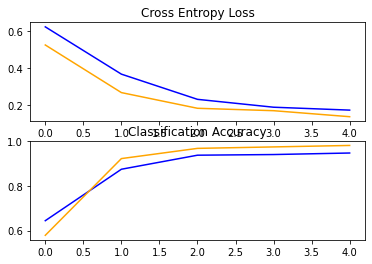

In [ ]:
# learning curves
summarize_diagnostics(history)

Saving 6801636876025_.pic_hd.jpg to 6801636876025_.pic_hd.jpg


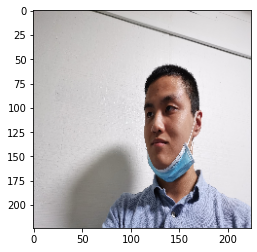

[0.]
6801636876025_.pic_hd.jpg is NOT wearing a mask


In [ ]:
import numpy as np
from google.colab import files
from tensorflow.keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(224, 224))
  plt.imshow(img)
  plt.show()

  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size=10)
  print(classes[0])
  if classes[0]>0.5:
    print(fn + " is wearing a mask")
  else:
    print(fn + " is NOT wearing a mask")

In [ ]:
!pip3 install cvlib
!pip3 install twilio


In [ ]:
# Code Source: https://github.com/humandecoded/People-Detector
import cv2
from argparse import ArgumentParser
import os
import sys
from datetime import datetime
#from twilio.rest import Client  # used for texting if you'd like, flag is optional
import smtplib, ssl # for sending email alerts
from email.message import EmailMessage
import imghdr


# these will need to be fleshed out to not miss any formats
IMG_EXTENSIONS = ['.jpg', '.jpeg', '.png', '.tiff', '.gif']
VID_EXTENSIONS = ['.mov', '.mp4', '.avi', '.mpg', '.mpeg', '.m4v', '.mkv']

# used to make sure we are at least examining one valid file
VALID_FILE_ALERT = False
# if an error is dectected, even once. Used for alerts
ERROR_ALERT = False
#used for alerts. True if human found once
HUMAN_DETECTED_ALERT = False


# function takes a file name(full path), checks that file for human shaped objects
# saves the frames with people detected into directory named 'save_directory'
def humanChecker(video_file_name, save_directory, yolo='yolov4', continuous=False, nth_frame=10, confidence=.65, gpu=False):

    # for modifying our global variarble VALID_FILE
    global VALID_FILE_ALERT

    # tracking if we've found a human or not
    is_human_found = False
    analyze_error = False
    is_valid = False

    # we'll need to increment every time a person is detected for file naming
    person_detection_counter = 0

    # check if image
    if os.path.splitext(video_file_name)[1] in IMG_EXTENSIONS:
        frame = cv2.imread(video_file_name)  # our frame will just be the image
        #make sure it's a valid image
        if frame is not None:
            frame_count = 8   # this is necessary so our for loop runs below
            nth_frame = 1
            VALID_FILE_ALERT = True
            is_valid = True
            print(f'Image')
        else:
            is_valid = False
            analyze_error = True
            

    # check if video
    elif os.path.splitext(video_file_name)[1] in VID_EXTENSIONS:
        vid = cv2.VideoCapture(video_file_name)
        # get approximate frame count for video
        frame_count = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))
        #make sure it's a valid video
        if frame_count > 0:
            VALID_FILE_ALERT = True
            is_valid = True
            print(f'{frame_count} frames')
        else:
            is_valid = False
            analyze_error = True
    else:
        print(f'\nSkipping {video_file_name}')
    
    if is_valid:
        # look at every nth_frame of our video file, run frame through detect_common_objects
        # Increase 'nth_frame' to examine fewer frames and increase speed. Might reduce accuracy though.
        # Note: we can't use frame_count by itself because it's an approximation and could lead to errors
        for frame_number in range(1, frame_count - 6, nth_frame):

            # if not dealing with an image
            if os.path.splitext(video_file_name)[1] not in IMG_EXTENSIONS:
                vid.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
                _, frame = vid.read()

            # feed our frame (or image) in to detect_common_objects
            try:
                
                bbox, labels, conf = cvlib.detect_common_objects(frame, model=yolo, confidence=confidence, enable_gpu=gpu)
            except Exception as e:
                print(e)
                analyze_error = True
                break

            if 'person' in labels:
                person_detection_counter += 1
                is_human_found = True

                # create image with bboxes showing people and then save
                marked_frame = cvlib.object_detection.draw_bbox(frame, bbox, labels, conf, write_conf=True)
                save_file_name = os.path.basename(os.path.splitext(video_file_name)[0]) + '-' + str(person_detection_counter) + '.jpeg'
                cv2.imwrite(save_directory + '/' + save_file_name , marked_frame)

                if continuous is False:
                    break

    return is_human_found, analyze_error


# takes a directory and returns all files and directories within
def getListOfFiles(dir_name):
    list_of_files = os.listdir(dir_name)
    all_files = list()
    # Iterate over all the entries
    for entry in list_of_files:
        # ignore hidden files and directories
        if entry[0] != '.':
            # Create full path
            full_path = os.path.join(dir_name, entry)
            # If entry is a directory then get the list of files in this directory 
            if os.path.isdir(full_path):
                all_files = all_files + getListOfFiles(full_path)
            else:
                all_files.append(full_path)
    return all_files


def twilioAlertSender(TWILIO_TOKEN, TWILIO_SID, TWILIO_FROM, TWILIO_TO):
    # if people are detected and --twilio flag has been set, send a text
    client = Client(TWILIO_SID, TWILIO_TOKEN)
    client.messages.create(body=f"Human Detected: {HUMAN_DETECTED_ALERT} \n Valid Files Examined: {VALID_FILE_ALERT} \n Errors Detected: {ERROR_ALERT}", from_=TWILIO_FROM, to=TWILIO_TO)



def emailAlertSender(save_directory, SENDER_EMAIL, SENDER_PASS, RECEIVER_EMAIL):

    port = 465  # For SSL
    smtp_server = "smtp.gmail.com"

    # set up our message body as contents of log file, if any
    with open(save_directory + '/' + save_directory + '.txt') as f:
        msg = EmailMessage()
        msg.set_content(f.read())

    msg['From'] = SENDER_EMAIL
    msg['To'] = RECEIVER_EMAIL
    if HUMAN_DETECTED_ALERT is True:
        msg['Subject'] = 'Intruder Alert'

    elif HUMAN_DETECTED_ALERT is False and VALID_FILE_ALERT is True:
        msg['Subject'] = 'All Clear'

    else:
        msg['Subject'] = 'No Valid Files Examined'

    list_of_files = os.listdir(save_directory)
    # add our attachments, ignoring the .txt file
    for image_file_name in list_of_files:
        if image_file_name[-3:] != 'txt':
            with open(save_directory + '/' + image_file_name, 'rb') as image:
                img_data = image.read()
            msg.add_attachment(img_data, maintype='image', subtype=imghdr.what(None, img_data), filename=image_file_name)

    context = ssl.create_default_context()
    with smtplib.SMTP_SSL(smtp_server, port, context=context) as server:
        server.login(SENDER_EMAIL, SENDER_PASS)
        server.send_message(msg)


#############################################################################################################################
if __name__ == "__main__":

    parser = ArgumentParser()
    parser.add_argument('-d', '--directory', default='', help='Path to video folder')
    parser.add_argument('-f', default='', help='Used to select an individual file')
    parser.add_argument('--twilio', action='store_true', help='Flag to use Twilio text notification')
    parser.add_argument('--email', action='store_true', help='Flag to use email notification')
    parser.add_argument('--tiny_yolo', action='store_true', help='Flag to indicate using YoloV4-tiny model instead of the full one. Will be faster but less accurate.')
    parser.add_argument('--continuous', action='store_true', help='This option will go through entire video file and save all frames with people. Default behavior is to stop after first person sighting.')
    parser.add_argument('--confidence', type=int, choices=range(1,100), default=65, help='Input a value between 1-99. This represents the percent confidence you require for a hit. Default is 65')
    parser.add_argument('--frames', type=int, default=10, help='Only examine every nth frame. Default is 10')
    parser.add_argument('--gpu', action='store_true', help='Attempt to run on GPU instead of CPU. Requires Open CV compiled with CUDA enables and Nvidia drivers set up correctly.')

    args = vars(parser.parse_args())

    # decide which model we'll use, default is 'yolov3', more accurate but takes longer
    if args['tiny_yolo']:
        yolo_string = 'yolov4-tiny'
    else:
        yolo_string = 'yolov4'

        
    #check our inputs, can only use either -f or -d but must use one
    if args['f'] == '' and args['directory'] == '':
        print('You must select either a directory with -d <directory> or a file with -f <file name>')
        sys.exit(1)
    if args['f'] != '' and args['directory'] != '' :
        print('Must select either -f or -d but can''t do both')
        sys.exit(1)

    # if the --twilio flag is used, this will look for environment variables holding this needed information
    # you can hardcode this information here if you'd like though. It's less secure but if you're the only one
    # using this script it's probably fine
    if args['twilio']:
        try:
            TWILIO_TOKEN = os.environ['TWILIO_TOKEN']
            TWILIO_SID = os.environ['TWILIO_SID']
            TWILIO_FROM = os.environ['TWILIO_FROM']
            TWILIO_TO = os.environ['TWILIO_TO']
        except:
            print('Something went wrong with the Twilio variables. Either set your environment variables or hardcode values in to script: TWILIO_TOKEN, TWILIO_SID, TWILIO_FROM, TWILIO_TO')
            sys.exit(1)

    # if the --email flag is used, this will look for environment variables holding this needed information
    # you can hardcode this information here if you'd like though. It's less secure but if you're the only one
    # using this script it's probably fine
    if args['email']:
        try:
            SENDER_EMAIL = os.environ['ALERT_SENDER_EMAIL']
            SENDER_PASS = os.environ['ALERT_SENDER_PASS']
            RECEIVER_EMAIL = os.environ['ALERT_RECEIVER_EMAIL']
        except:
            print('Something went wrong with Email variables. Either set your environment variables or hardcode values in to script')
            sys.exit(1)

    every_nth_frame = args['frames']
    confidence_percent = args['confidence'] / 100
    
    gpu_flag = False
    if args['gpu']:
        gpu_flag = True

    # create a directory to hold snapshots and log file
    time_stamp = datetime.now().strftime('%m%d%Y-%H:%M:%S')
    os.mkdir(time_stamp)

    print('Beginning Detection')
    print(f'Directory {time_stamp} has been created')
    print(f"Email notifications set to {args['email']}. Text notification set to {args['twilio']}.")
    print(f"Confidence threshold set to {args['confidence']}%")
    print(f'Examining every {every_nth_frame} frames.')
    print(f"Continous examination is set to {args['continuous']}")
    print(f"GPU is set to {args['gpu']}")
    print('\n\n')
    print(datetime.now().strftime('%m%d%Y-%H:%M:%S'))

    # open a log file and loop over all our video files
    with open(time_stamp + '/' + time_stamp +'.txt', 'w') as log_file:
        if args['f'] == '':
            video_directory_list = getListOfFiles(args['directory'] + '/')
        else:
            video_directory_list = [args['f']]

        # what video we are on
        working_on_counter = 1

        for video_file in video_directory_list:
            print(f'Examining {video_file}: {working_on_counter} of {len(video_directory_list)}: {int((working_on_counter/len(video_directory_list)*100))}%    ', end='')

            # check for people
            human_detected, error_detected =  humanChecker(str(video_file), time_stamp, yolo=yolo_string, nth_frame=every_nth_frame, confidence=confidence_percent, continuous=args['continuous'], gpu=gpu_flag)
                
            if human_detected:    
                HUMAN_DETECTED_ALERT = True
                print(f'Human detected in {video_file}')
                log_file.write(f'{video_file} \n' )
            
            if error_detected:
                ERROR_ALERT = True
                print(f'\nError in analyzing {video_file}')
                log_file.write(f'Error in analyzing {video_file} \n' )

            working_on_counter += 1

    if VALID_FILE_ALERT is False:
        print('No valid image or video files were examined')

    if args['twilio'] is True:
        twilioAlertSender(TWILIO_TOKEN, TWILIO_SID, TWILIO_FROM, TWILIO_TO)

    if args['email'] is True:
        emailAlertSender(time_stamp, SENDER_EMAIL, SENDER_PASS, RECEIVER_EMAIL)
    print(datetime.now().strftime('%m%d%Y-%H:%M:%S'))




Beginning Detection
Directory 12102021-03:04:42 has been created
Email notifications set to False. Text notification set to False.
Confidence threshold set to 65%
Examining every 10 frames.
Continous examination is set to False
GPU is set to False



12102021-03:04:42
Examining /root/.local/share/jupyter/runtime/kernel-34b9b137-8d80-4c18-b990-4e089a23b6ed.json: 1 of 1: 100%    
Skipping /root/.local/share/jupyter/runtime/kernel-34b9b137-8d80-4c18-b990-4e089a23b6ed.json
No valid image or video files were examined
12102021-03:04:42


In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/drive/MyDrive/human-test.mp4','rb').read()
data_url = "data:/content/drive/MyDrive/human-test/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="/content/drive/MyDrive/human-test/mp4">
</video>
""" % data_url)



In [ ]:
humanChecker(mp4, '/content/drive/My Drive', yolo='yolov4', continuous=False, nth_frame=10, confidence=0.65, gpu=False)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(False, False)